In [ ]:
import cv2
import numpy as np
import scipy
import skimage
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torchvision.transforms as transforms
import torchvision.models as models

# Region Growing for Image Segmentation

In this notebook, we'll implement the region growing algorithm for image segmentation. Region growing is a technique that segments an image based on the growth of regions from seed points, expanding regions based on predefined criteria such as pixel intensity or color similarity.

## Import Libraries

We'll start by importing the necessary libraries for image processing and visualization.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color
from skimage.filters import threshold_otsu
from skimage.morphology import binary_dilation


## Load and Preprocess the Image

We will load an image, convert it to grayscale, and apply a binary threshold to create a binary image. This binary image will serve as the basis for region growing.


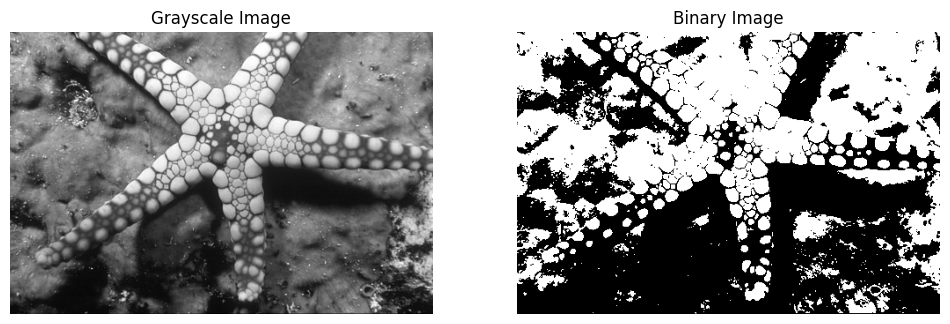

In [ ]:
img_path = '/content/drive/MyDrive/Colab Notebooks/MV/Lab 2/MVLAB_IMAGES/Ex-3images/12003.jpg'
image = io.imread(img_path)
gray_image = color.rgb2gray(image)

# Apply thresholding to create a binary image
thresh = threshold_otsu(gray_image)
binary_image = gray_image > thresh

# Display the original and binary images
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(binary_image, cmap='gray')
plt.title('Binary Image')
plt.axis('off')

plt.show()


## Define the Region Growing Function

Next, we will define the region growing function. This function will start from a seed point and grow the region by including neighboring pixels that meet the similarity criteria.


In [ ]:
def region_growing(binary_image, seed_point, threshold):

    region = np.zeros_like(binary_image, dtype=bool)
    region[seed_point] = True

    to_process = [seed_point]

    rows, cols = binary_image.shape

    neighbors = [(-1, 0), (1, 0), (0, -1), (0, 1)]

    while to_process:
        r, c = to_process.pop()
        for dr, dc in neighbors:
            nr, nc = r + dr, c + dc
            if 0 <= nr < rows and 0 <= nc < cols and not region[nr, nc] and binary_image[nr, nc]:
                if np.abs(binary_image[nr, nc] - binary_image[r, c]) <= threshold:
                    region[nr, nc] = True
                    to_process.append((nr, nc))

    return region


## Apply Region Growing and Visualize Results

We will apply the region growing algorithm using a specific seed point and threshold. The results will be visualized alongside the original binary image.


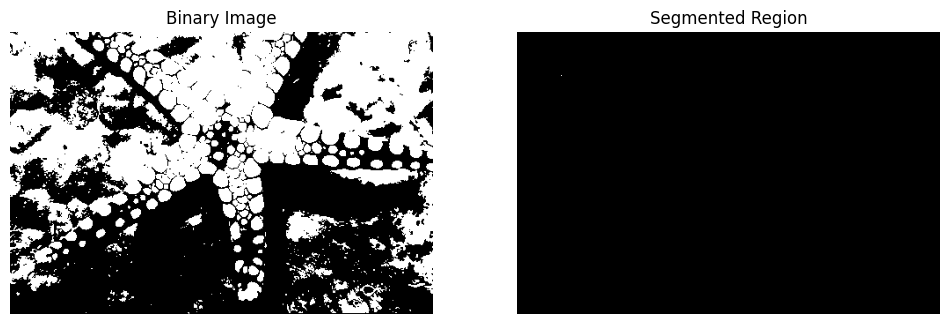

In [ ]:
seed_point = (50, 50)  # Replace with your seed point
threshold = 10  # Intensity threshold for region growing

segmented_region = region_growing(binary_image, seed_point, threshold)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(binary_image, cmap='gray')
plt.title('Binary Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(segmented_region, cmap='gray')
plt.title('Segmented Region')
plt.axis('off')

plt.show()


##Region Grouping

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


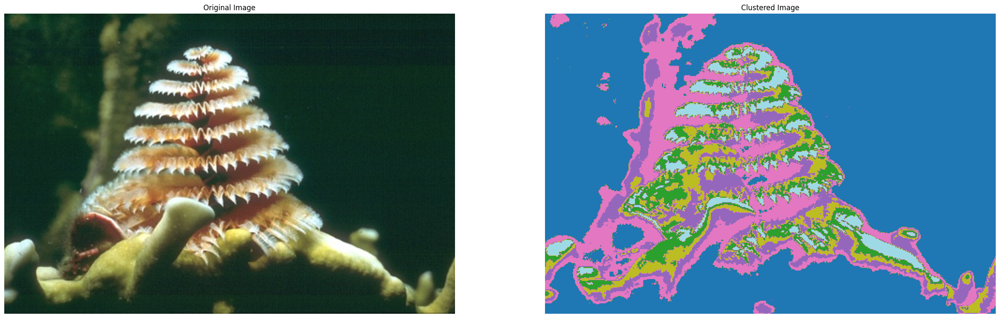

In [ ]:
from PIL import Image
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt


img = Image.open('/content/drive/MyDrive/Colab Notebooks/MV/Lab 2/MVLAB_IMAGES/Ex-3images/12074.jpg').convert('RGB')
img_array = np.array(img)

pixels = img_array.reshape(-1, 3)

num_clusters = 6  # Number of clusters you want
kmeans = KMeans(n_clusters=num_clusters)
clusters = kmeans.fit_predict(pixels)

clustered_image = clusters.reshape(img_array.shape[:2])

# Plot the results
fig, ax = plt.subplots(1, 2, figsize=(30, 12))

# Display original image
ax[0].imshow(img)
ax[0].set_title('Original Image')
ax[0].axis('off')

# Display clustered image
cmap = plt.get_cmap('tab20', num_clusters)  # Create a colormap with distinct colors
ax[1].imshow(clustered_image, cmap=cmap)
ax[1].set_title('Clustered Image')
ax[1].axis('off')

plt.show()

In [ ]:
image_path = '/content/drive/MyDrive/Colab Notebooks/MV/Lab 2/MVLAB_IMAGES/Ex-3images/12074.jpg'
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

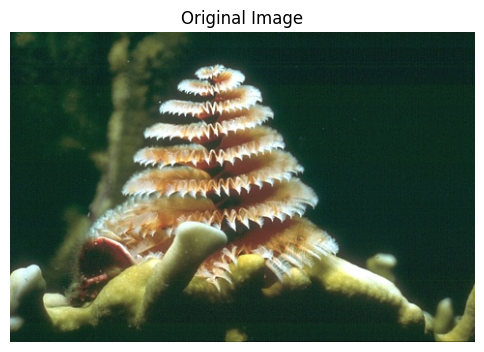

In [ ]:
plt.figure(figsize=(6, 6))
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')
plt.show()

In [ ]:
pixel_values = image.reshape((-1, 3))
pixel_values = np.float32(pixel_values)

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
k = 3
_, labels, (centers) = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

centers = np.uint8(centers)

segmented_image = centers[labels.flatten()]
segmented_image = segmented_image.reshape(image.shape)

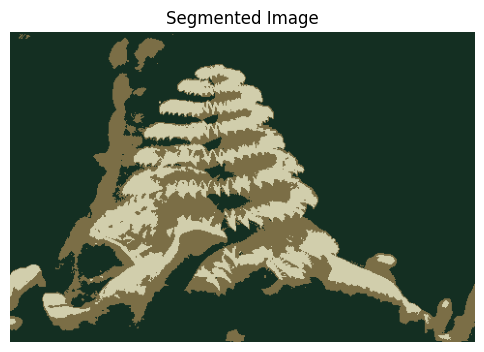

In [ ]:
plt.figure(figsize=(6, 6))
plt.imshow(segmented_image)
plt.title('Segmented Image')
plt.axis('off')
plt.show()

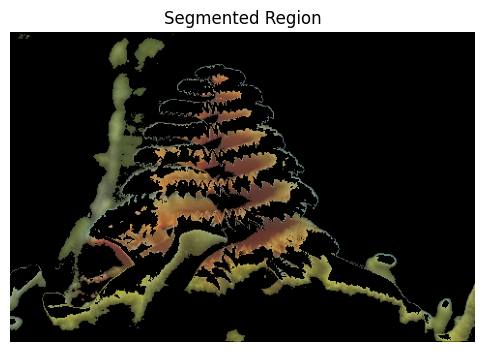

In [ ]:
labels = labels.reshape(image.shape[:2])

mask = labels == 0
segmented_region = np.copy(image)
segmented_region[~mask] = 0

plt.figure(figsize=(6, 6))
plt.imshow(segmented_region)
plt.title('Segmented Region')
plt.axis('off')
plt.show()

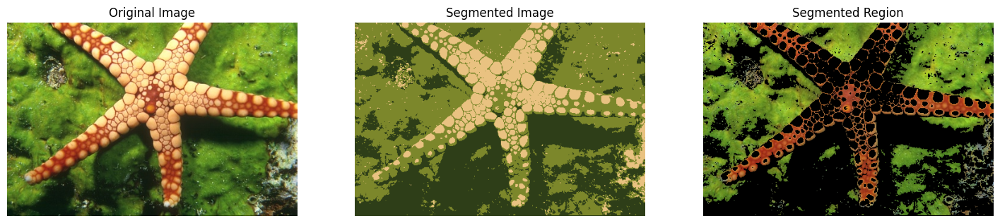

In [ ]:
image_path = '/content/drive/MyDrive/Colab Notebooks/MV/Lab 2/MVLAB_IMAGES/Ex-3images/12003.jpg'
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

pixel_values = image.reshape((-1, 3))
pixel_values = np.float32(pixel_values)

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
k = 3
_, labels, (centers) = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

centers = np.uint8(centers)

segmented_image = centers[labels.flatten()]
segmented_image = segmented_image.reshape(image.shape)

labels = labels.reshape(image.shape[:2])

mask = labels == 0

segmented_region = np.copy(image)
segmented_region[~mask] = 0

plt.figure(figsize=(18, 6))

# Original Image
plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

# Segmented Image
plt.subplot(1, 3, 2)
plt.imshow(segmented_image)
plt.title('Segmented Image')
plt.axis('off')

# Segmented Region
plt.subplot(1, 3, 3)
plt.imshow(segmented_region)
plt.title('Segmented Region')
plt.axis('off')

# Show the plots
plt.show()

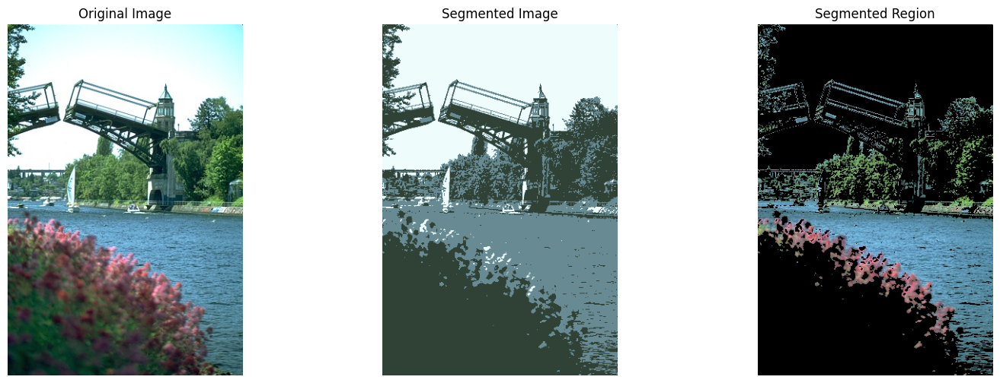

In [ ]:
image_path = '/content/drive/MyDrive/Colab Notebooks/MV/Lab 2/MVLAB_IMAGES/Ex-3images/22093.jpg'
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

pixel_values = image.reshape((-1, 3))
pixel_values = np.float32(pixel_values)

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
k = 3
_, labels, (centers) = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

centers = np.uint8(centers)

segmented_image = centers[labels.flatten()]
segmented_image = segmented_image.reshape(image.shape)

labels = labels.reshape(image.shape[:2])

mask = labels == 0
segmented_region = np.copy(image)
segmented_region[~mask] = 0  # Mask out all other regions

plt.figure(figsize=(18, 6))

# Original Image
plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

# Segmented Image
plt.subplot(1, 3, 2)
plt.imshow(segmented_image)
plt.title('Segmented Image')
plt.axis('off')

# Segmented Region
plt.subplot(1, 3, 3)
plt.imshow(segmented_region)
plt.title('Segmented Region')
plt.axis('off')

# Show the plots
plt.show()

##Split & Merge

In [ ]:
from PIL import Image
import numpy as np
from scipy.ndimage import uniform_filter
import matplotlib.pyplot as plt

In [ ]:
def split_image(image, block_size):
    """
    Splits the image into blocks of size block_size.
    """
    img_array = np.array(image)
    rows, cols = img_array.shape[0], img_array.shape[1]
    blocks = []

    for r in range(0, rows, block_size):
        for c in range(0, cols, block_size):
            block = img_array[r:r + block_size, c:c + block_size]
            blocks.append(block)
    return blocks

def merge_blocks(blocks, img_shape, block_size):
    """
    Merges blocks back into an image of the original shape.
    """
    rows, cols = img_shape
    merged_image = np.zeros((rows, cols, 3), dtype=np.uint8)

    idx = 0
    for r in range(0, rows, block_size):
        for c in range(0, cols, block_size):
            block = blocks[idx]
            merged_image[r:r + block_size, c:c + block_size] = block
            idx += 1
    return merged_image

def calculate_variance(block):
    """
    Calculate variance of a block.
    """
    return np.var(block)

def split_merge(image, block_size, threshold):
    """
    Apply Split and Merge algorithm on the image.
    """
    blocks = split_image(image, block_size)
    merged_blocks = []

    for block in blocks:
        if calculate_variance(block) > threshold:
            merged_blocks.append(block)
        else:
            # If variance is low, consider it as a single region
            merged_blocks.append(np.mean(block, axis=(0, 1), dtype=np.uint8))

    return merge_blocks(merged_blocks, image.size[::-1], block_size)

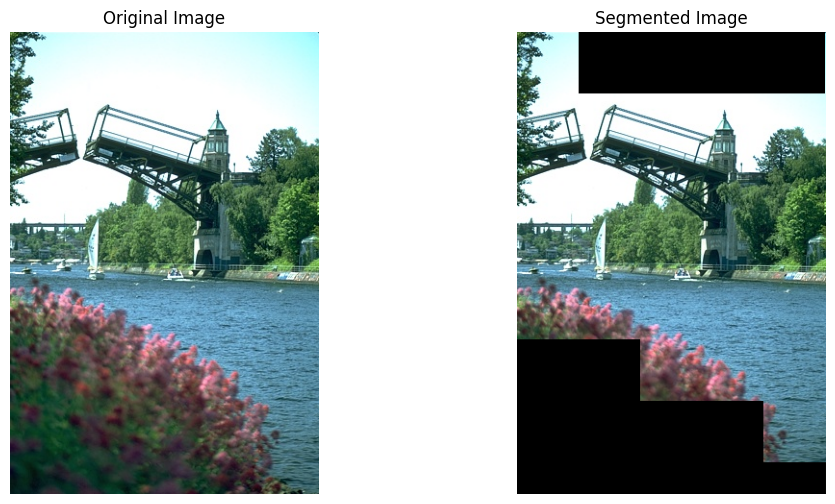

In [ ]:
img_path = '/content/drive/MyDrive/Colab Notebooks/MV/Lab 2/MVLAB_IMAGES/Ex-3images/22093.jpg'
img = Image.open(img_path).convert('RGB')

# Parameters
block_size = 64
threshold = 1000  # Adjust based on your image

# Apply Split and Merge algorithm
segmented_image = split_merge(img, block_size, threshold)

# Plot the results
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

ax[0].imshow(img)
ax[0].set_title('Original Image')
ax[0].axis('off')

ax[1].imshow(segmented_image)
ax[1].set_title('Segmented Image')
ax[1].axis('off')

plt.show()

##Thresholding - Segmenting by logical condition

In [ ]:
name = 'star'
image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/MV/Lab 2/MVLAB_IMAGES/Ex-3images/12003.jpg'.format(name))
print('Image matrix shape {}'.format(image.shape))

Image matrix shape (321, 481, 3)


In [ ]:
def rowPlot(images, subtitles, title):

    f, ax = plt.subplots(1, len(images), figsize = (5*len(images), 5))
    for i, (x, im) in enumerate(zip(ax, images)):
        if(len(im.shape) == 3):
            x.imshow(im)
        else:
            x.imshow(im, cmap = 'gray')
        x.set_title(subtitles[i])
        x.axis('off')

    f.suptitle(title)
    plt.show()

In [ ]:
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_g = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
print('Image matrix shape {}'.format(image_g.shape))

Image matrix shape (321, 481)


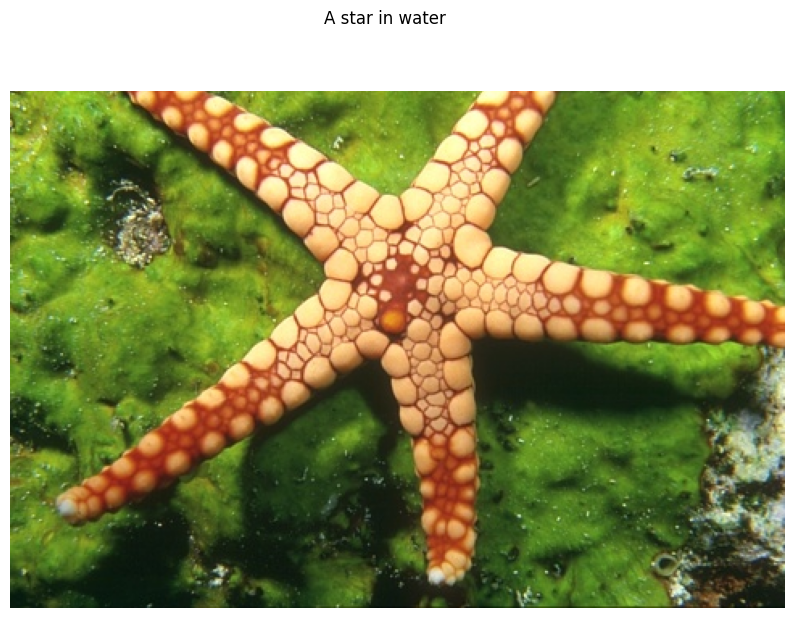

In [ ]:
f, ax = plt.subplots(1, 1, figsize = (10, 7))
ax.imshow(image)
ax.axis('off')
plt.suptitle('A star in water')
plt.show()

In [ ]:
def simple_thresholding1(img, thr):

    img_t = np.where(img >= thr, 255, 0)

    return img_t

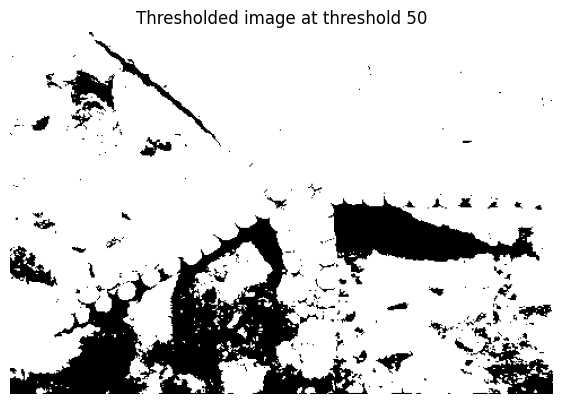

In [ ]:
thr = 50
image_th1 = simple_thresholding1(image_g, thr)

f, ax = plt.subplots(1, 1, figsize = (7, 7))
ax.axis('off')
plt.imshow(image_th1, cmap = 'gray')
plt.title('Thresholded image at threshold {}'.format(thr))
plt.show()

In [ ]:
def image_hist(img):

    if len(img.shape) == 3:
        f, ax = plt.subplots(1, 3, figsize = (20, 5))
        ax[0].plot(cv2.calcHist([img[:, :, 0]],[0],None,[256],[0,256]), color = 'red')
        ax[1].plot(cv2.calcHist([img[:, :, 0]],[0],None,[256],[0,256]), color = 'green')
        ax[2].plot(cv2.calcHist([img[:, :, 0]],[0],None,[256],[0,256]), color = 'blue')
        plt.show()
    else:
        f, ax = plt.subplots(1, 1, figsize = (20, 5))
        ax.plot(cv2.calcHist([img[:, :]],[0],None,[256],[0,256]), color = 'black')
    plt.title('Image Histogram')
    plt.ylabel('Counts')
    plt.xlabel('Intensity Level')
    plt.show()

# function to perform simple thresholding operation with two threshold values

def simple_thresholding2(img, thr1, thr2):

    img_t = np.where(img >= thr2, 255, np.where(img >= thr1, 125, 0))

    return img_t

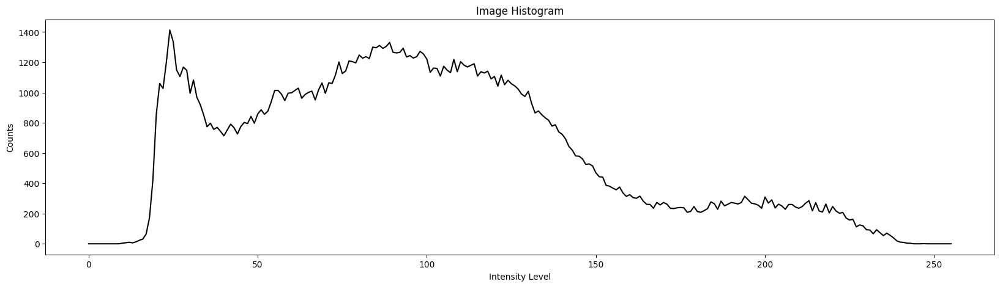

In [ ]:
image_hist(image_g)

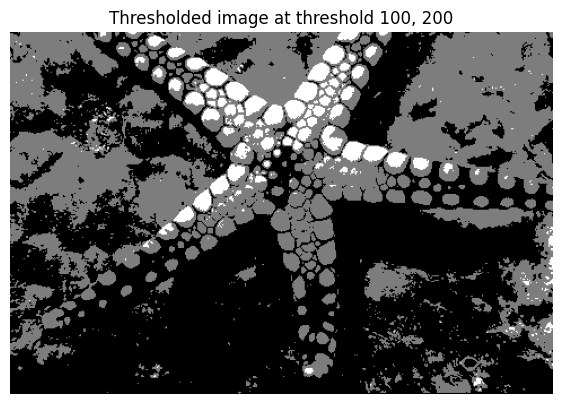

In [ ]:
t1, t2 = 100, 200
image_th1 = simple_thresholding2(image_g, t1, t2)
f, ax = plt.subplots(1, 1, figsize = (7, 7))
ax.axis('off')
plt.imshow(image_th1, cmap = 'gray')
plt.title('Thresholded image at threshold {}, {}'.format(t1, t2))
plt.show()

interactive(children=(IntSlider(value=1, description='threshold', max=250, step=2), Output()), _dom_classes=('…

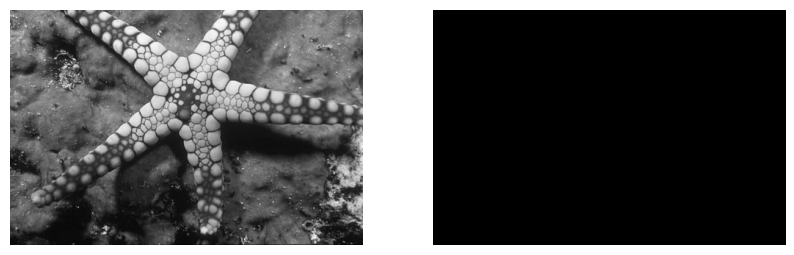

In [ ]:
from ipywidgets import interact, widgets

def plot_thr(threshold):
    image_th1 = simple_thresholding1(image_g, threshold)
    ax[1].imshow(image_th1, cmap="gray")
    f.canvas.draw()
    display(f)

f, ax = plt.subplots(1, 2, figsize = (10, 5))

ax[0].imshow(image_g, cmap="gray")
ax[1].imshow(image_g, cmap="gray")

ax[0].axis('off')
ax[1].axis('off')

interact(plot_thr, threshold=widgets.IntSlider(min=0,max=250,step=2,value=1));

##Simple Thresholding Techniques in OpenCV

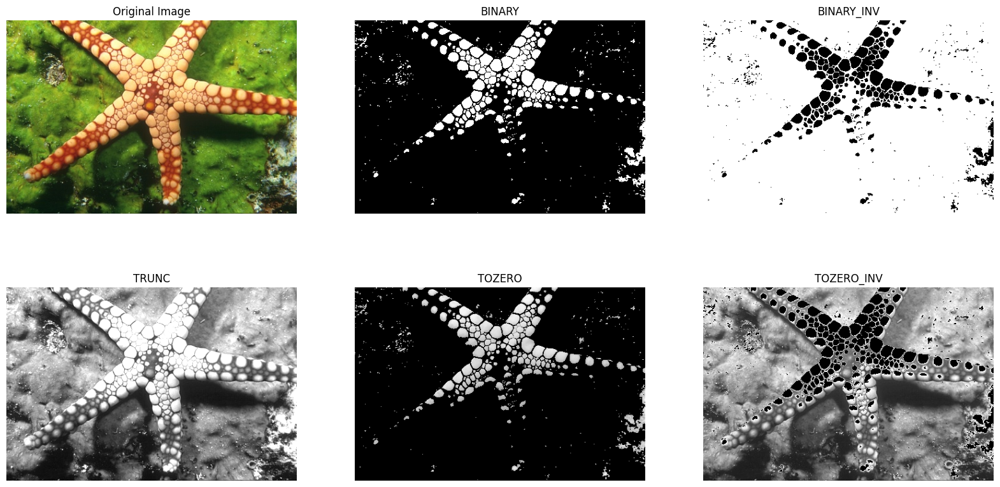

In [ ]:
ret,thresh1 = cv2.threshold(image_g, 160, 235, cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(image_g, 160, 235, cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(image_g, 160, 235, cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(image_g, 160, 235, cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(image_g, 160, 235, cv2.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [image, thresh1, thresh2, thresh3, thresh4, thresh5]

f, ax = plt.subplots(2, 3, figsize = (20, 10))
for i in range(2):
    for j in range(3):
        ax[i][j].imshow(images[3*i+j],'gray')
        ax[i][j].set_title(titles[3*i+j])
        ax[i][j].axis('off')

plt.show()

##Adaptive Thresholding Techniques in OpenCV

interactive(children=(IntSlider(value=11, description='size', max=320, min=11, step=2), Output()), _dom_classe…

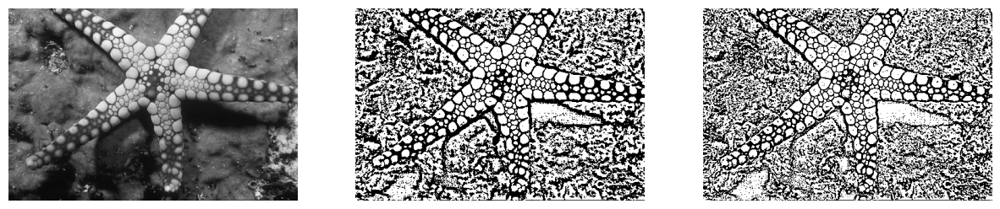

In [ ]:
def plot_thr(size):
    th2 = cv2.adaptiveThreshold(image_g,255,cv2.ADAPTIVE_THRESH_MEAN_C,\
            cv2.THRESH_BINARY,size,2)
    th3 = cv2.adaptiveThreshold(image_g,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,size,2)

    ax[1].imshow(th2, cmap="gray")
    ax[2].imshow(th3, cmap="gray")
    f.canvas.draw()
    display(f)

f, ax = plt.subplots(1, 3, figsize = (15, 5))

ax[0].imshow(image_g, cmap="gray")
ax[1].imshow(image_g, cmap="gray")
ax[2].imshow(image_g, cmap="gray")

ax[0].axis('off')
ax[1].axis('off')
ax[2].axis('off')

interact(plot_thr, size=widgets.IntSlider(min=11,max=min(image_g.shape[0], image_g.shape[1]) - 1,step=2,value=1));

##Watershed Algorithm

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, filters, morphology, segmentation, feature
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
from skimage.segmentation import watershed
from skimage.feature import peak_local_max
from scipy import ndimage as ndi

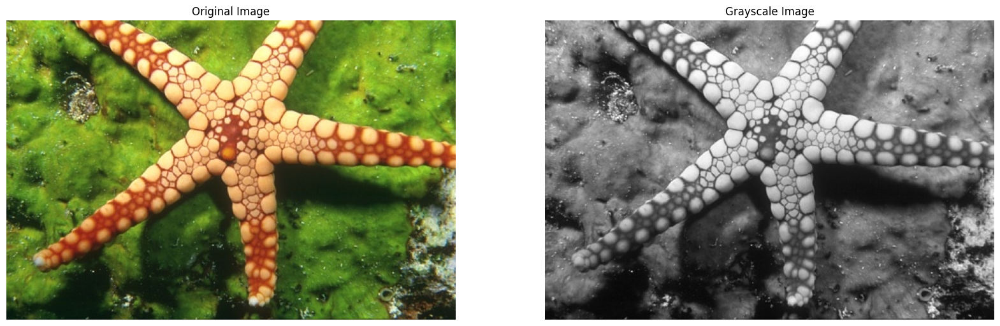

In [ ]:

image
plt.figure(figsize=(20, 8))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

gray_image = rgb2gray(image)
plt.subplot(1, 2, 2)
plt.imshow(gray_image, cmap='gray')
plt.title('Grayscale Image')
plt.axis('off')
plt.show()

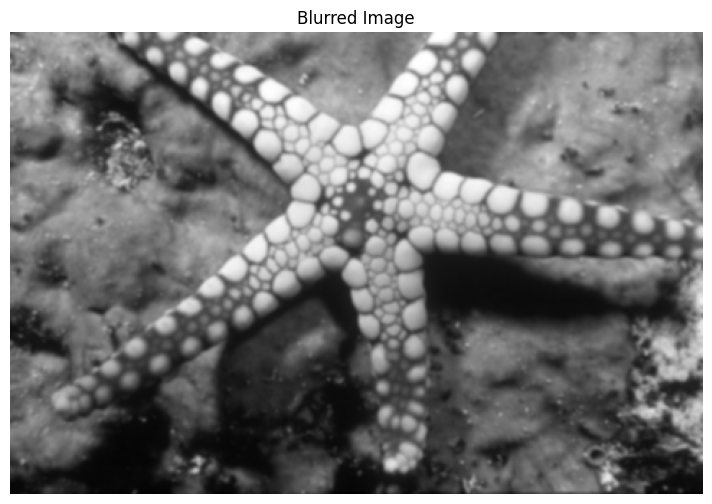

In [ ]:
blurred_image = filters.gaussian(gray_image, sigma=1.0)
plt.figure(figsize=(10, 6))
plt.imshow(blurred_image, cmap='gray')
plt.title('Blurred Image')
plt.axis('off')
plt.show()

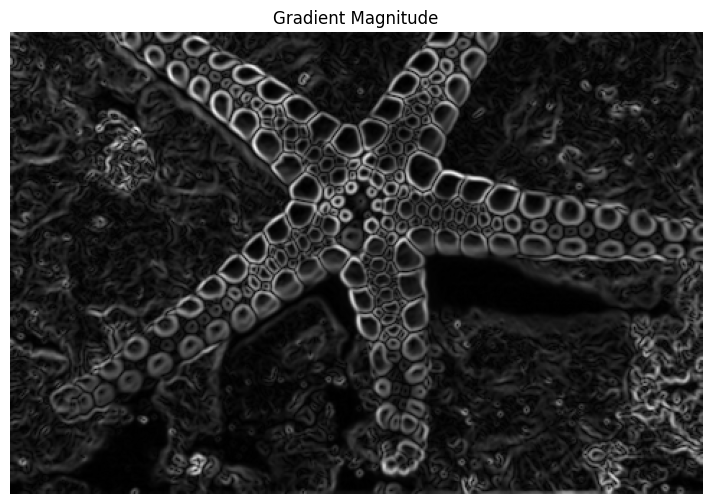

In [ ]:
gradient = np.sqrt(np.square(np.gradient(blurred_image)[0]) + np.square(np.gradient(blurred_image)[1]))
plt.figure(figsize=(10, 6))
plt.imshow(gradient, cmap='gray')
plt.title('Gradient Magnitude')
plt.axis('off')
plt.show()

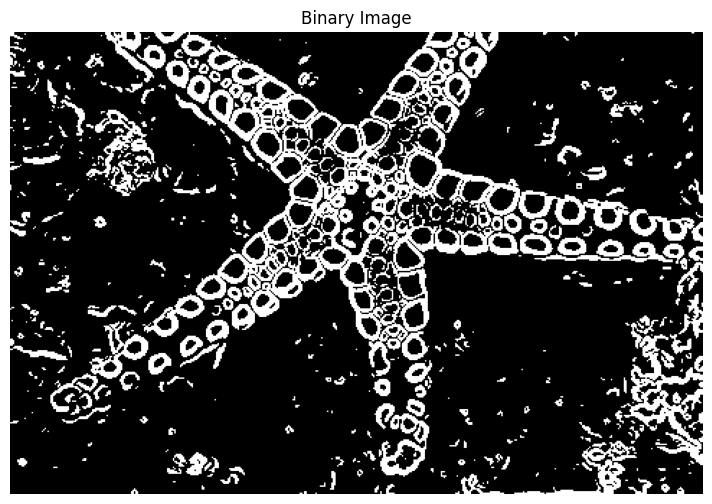

In [ ]:
thresh = threshold_otsu(gradient)
binary = gradient > thresh
plt.figure(figsize=(10, 6))
plt.imshow(binary, cmap='gray')
plt.title('Binary Image')
plt.axis('off')
plt.show()

In [ ]:
!pip install scikit-image

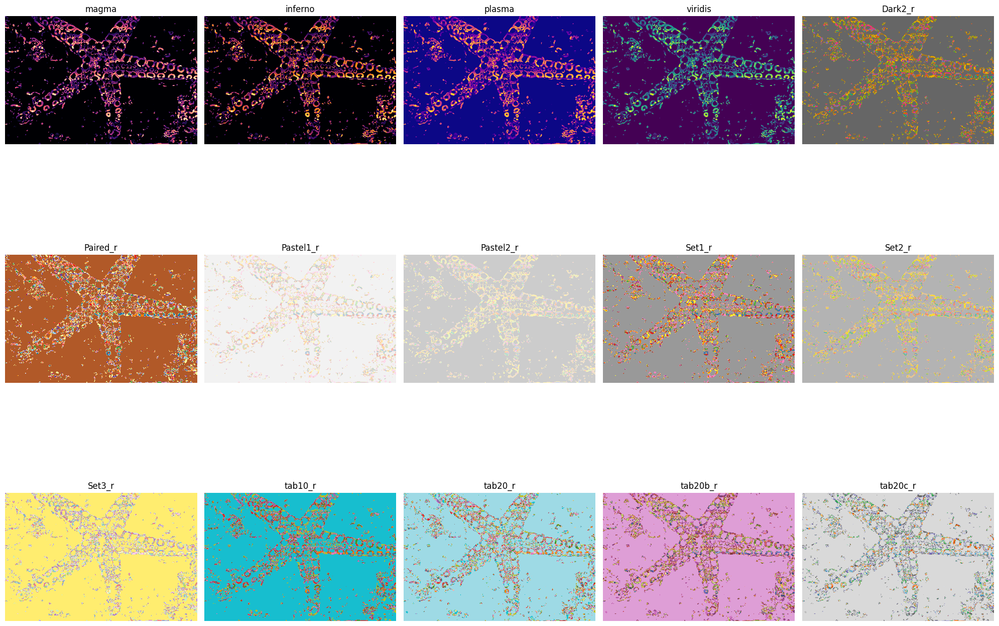

In [ ]:
import numpy as np
import scipy.ndimage as ndi
from skimage.feature import peak_local_max
from skimage.segmentation import watershed
import matplotlib.pyplot as plt
from skimage import io

distance = ndi.distance_transform_edt(binary)
local_max = peak_local_max(distance, footprint=np.ones((3, 3)), labels=binary)

markers = np.zeros(binary.shape, dtype=np.uint8)
markers[tuple(local_max.T)] = np.arange(1, len(local_max) + 1)

labels = watershed(-distance, markers, mask=binary)

colormaps = [
    'magma', 'inferno', 'plasma', 'viridis',    'Dark2_r', 'Paired_r', 'Pastel1_r', 'Pastel2_r', 'Set1_r', 'Set2_r', 'Set3_r', 'tab10_r', 'tab20_r', 'tab20b_r', 'tab20c_r'
]

# Create subplots
n_cmaps = len(colormaps)
fig, axes = plt.subplots(nrows=(n_cmaps // 5) + (n_cmaps % 5 > 0), ncols=5, figsize=(20, 4 * ((n_cmaps // 5) + 1)))

# Flatten the axes array
axes = axes.flatten()

# Plot each colormap
for ax, cmap in zip(axes, colormaps):
    ax.imshow(labels, cmap=cmap)
    ax.set_title(cmap)
    ax.axis('off')

# Turn off unused subplots
for ax in axes[len(colormaps):]:
    ax.axis('off')

plt.tight_layout()
plt.show()

# Image Segmentation and Region Analysis

In this notebook, we will perform image segmentation using thresholding, followed by an analysis of the segmented regions. The analysis includes extracting various properties of the regions and visualizing the results.

## 1. Import Libraries

We start by importing the necessary libraries for image processing and analysis.


In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import measure, color
from skimage.filters import threshold_otsu
from skimage.segmentation import clear_border

## 2. Load the Image

Next, we load the input image that we want to analyze. We will convert the image to grayscale for further processing.


In [2]:
image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/MV/Lab 2/MVLAB_IMAGES/Ex-3images/12003.jpg')
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

## 3. Image Segmentation using Thresholding

We apply Otsu's thresholding method to segment the image into foreground and background. The binary mask generated from thresholding is used for region analysis.


In [3]:
thresh_value = threshold_otsu(gray_image)
binary_mask = gray_image > thresh_value

## 4. Clear Border and Label Regions

To remove small objects touching the border and label the connected regions, we clear the border and label the regions.


In [4]:
cleared_mask = clear_border(binary_mask)
labeled_image, num_labels = measure.label(cleared_mask, background=0, return_num=True)

## 5. Extract Region Properties

We extract various properties of the labeled regions, such as area, centroid, and bounding box, using `regionprops`.


In [5]:
regions = measure.regionprops(labeled_image)

## 6. Visualize Segmented Regions and Their Properties

We visualize the original image with the segmented regions highlighted. Each region's bounding box and centroid are also displayed.

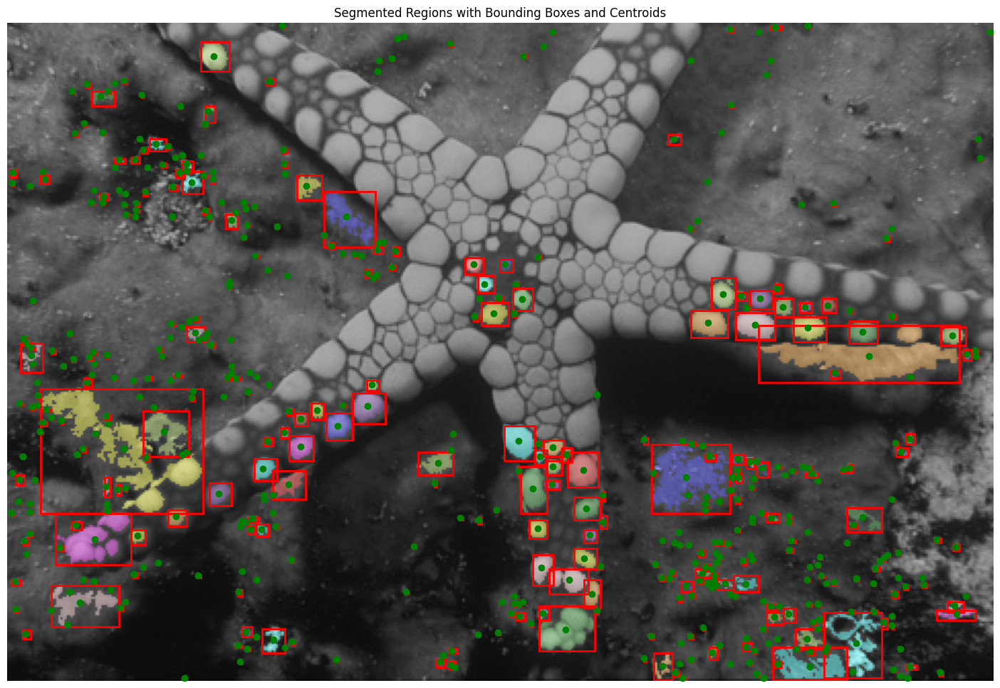

In [8]:
fig, ax = plt.subplots(figsize=(30, 12))
ax.imshow(color.label2rgb(labeled_image, image=gray_image, bg_label=0))

for region in regions:
    minr, minc, maxr, maxc = region.bbox
    ax.add_patch(plt.Rectangle((minc, minr), maxc - minc, maxr - minr,
                                fill=False, edgecolor='red', linewidth=2))
    ax.plot(region.centroid[1], region.centroid[0], 'go')

ax.set_title('Segmented Regions with Bounding Boxes and Centroids')
ax.axis('off')
plt.show()

## 7. Region Properties Analysis

Finally, we analyze and display some key properties of each segmented region, such as area and centroid coordinates.


In [9]:
for i, region in enumerate(regions):
    print(f"Region {i+1}:")
    print(f" - Area: {region.area}")
    print(f" - Centroid: {region.centroid}")
    print(f" - Bounding Box: {region.bbox}\n")

Region 1:
 - Area: 2.0
 - Centroid: (1.0, 133.5)
 - Bounding Box: (1, 133, 2, 135)

Region 2:
 - Area: 8.0
 - Centroid: (1.5, 374.0)
 - Bounding Box: (1, 372, 3, 377)

Region 3:
 - Area: 1.0
 - Centroid: (1.0, 390.0)
 - Bounding Box: (1, 390, 2, 391)

Region 4:
 - Area: 4.0
 - Centroid: (2.5, 352.0)
 - Bounding Box: (2, 351, 4, 354)

Region 5:
 - Area: 2.0
 - Centroid: (4.0, 265.5)
 - Bounding Box: (4, 265, 5, 267)

Region 6:
 - Area: 1.0
 - Centroid: (4.0, 366.0)
 - Bounding Box: (4, 366, 5, 367)

Region 7:
 - Area: 1.0
 - Centroid: (4.0, 479.0)
 - Bounding Box: (4, 479, 5, 480)

Region 8:
 - Area: 1.0
 - Centroid: (6.0, 193.0)
 - Bounding Box: (6, 193, 7, 194)

Region 9:
 - Area: 1.0
 - Centroid: (7.0, 190.0)
 - Bounding Box: (7, 190, 8, 191)

Region 10:
 - Area: 140.0
 - Centroid: (15.764285714285714, 100.39285714285714)
 - Bounding Box: (9, 94, 23, 108)

Region 11:
 - Area: 3.0
 - Centroid: (9.666666666666666, 215.66666666666666)
 - Bounding Box: (9, 215, 11, 217)

Region 12:
 - Ar

## Conclusion

This notebook demonstrated how to perform image segmentation and analyze the properties of segmented regions. The segmented regions were visualized, and key properties such as area, centroid, and bounding box were extracted and displayed.